<a href="https://colab.research.google.com/github/akanshagautam3751/module1Solution/blob/master/code_nlp_ass2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Mount the Google Drive

In [34]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [35]:
import codecs

# Get Familiar with the data

## 1. Read the corpus file

Read the corpus file using `readlines()`. Use a for loop to add all the lines into sentences list after stripping the sentences using `strip()` method. 

In [36]:
file_path = "/content/gdrive/My Drive/NLP/Assignment_2/Brown_train.txt"
sentences = []

file = codecs.open(file_path, 'r+', encoding = 'utf-8', errors = 'ignore')
lines = file.readlines()

for line in lines:
  sentences.append(line.strip())

In [37]:
sentences[0]

"The_AT Fulton_NP-TL County_NN-TL Grand_JJ-TL Jury_NN-TL said_VBD Friday_NR an_AT investigation_NN of_IN Atlanta's_NP$ recent_JJ primary_NN election_NN produced_VBD ``_`` no_AT evidence_NN ''_'' that_CS any_DTI irregularities_NNS took_VBD place_NN ._."

## 2. Extract all sentences

In [38]:
len(sentences)

55145

## 3. Split individual sentences into word-tag pairs.

In [39]:
import nltk
import pandas as pd
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
from nltk.tokenize import word_tokenize
import string
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


I've removed all the punctuations before splitting into word-tag pairs to get a clear pairs. Also, I'm considering the words with length>1 because many words with length 1 does not contain any tag with it. 


In [40]:
sentences_word_tag = []

for sentence in sentences:
  words = word_tokenize(sentence) # word tokenization
  sentence_word_tag = []
  for word_tag_pair in words:
    if (word_tag_pair[0] not in string.punctuation) and (len(word_tag_pair)>1): #remove all the punctuations 
      word, sep, tag = word_tag_pair.partition('_') # split the string "_"
      sentence_word_tag.append(tuple((word, tag))) #add word, tag of each sentence
  sentences_word_tag.append(sentence_word_tag) 


In [41]:
sentences_word_tag[0]

[('The', 'AT'),
 ('Fulton', 'NP-TL'),
 ('County', 'NN-TL'),
 ('Grand', 'JJ-TL'),
 ('Jury', 'NN-TL'),
 ('said', 'VBD'),
 ('Friday', 'NR'),
 ('an', 'AT'),
 ('investigation', 'NN'),
 ('of', 'IN'),
 ("Atlanta's", 'NP'),
 ('recent', 'JJ'),
 ('primary', 'NN'),
 ('election', 'NN'),
 ('produced', 'VBD'),
 ('no', 'AT'),
 ('evidence', 'NN'),
 ('that', 'CS'),
 ('any', 'DTI'),
 ('irregularities', 'NNS'),
 ('took', 'VBD'),
 ('place', 'NN')]

## 4. Let's get an idea about the data




### 4.1 How many words are present in vocab?

In [42]:
count_words = 0

for sent in sentences_word_tag:
  for word in sent:
    count_words += 1

print("Total number of words are:", count_words)

Total number of words are: 1013033


### 4.2 How many tags are present in the vocab?

In [43]:
all_tags = []

for sent in sentences_word_tag:
  for word in sent:
    all_tags.append(word[1])

print("Total number of unique tags in the vocab:", len(set(list(all_tags))))

Total number of unique tags in the vocab: 422


### 4.3 Min / Max / Average length of sentences.

In [44]:
sentences_length = []

for sent in sentences_word_tag:
  sentences_length.append(len(sent))

print("Minimum length of sentences:", min(sentences_length))
print("Maximum length of sentences:", max(sentences_length))
print("Average length of sentences:", round(sum(sentences_length)/len(sentences_length), 2))

Minimum length of sentences: 0
Maximum length of sentences: 199
Average length of sentences: 18.37


In [45]:
empty_sentences = 0

for sent in sentences_word_tag:
  if(len(sent))<1:
    empty_sentences += 1

print("Count of the empty sentences:", empty_sentences)

Count of the empty sentences: 3113


Data Cleaning: Remove the empty sentences 

In [46]:
for sent in sentences_word_tag:
  if(len(sent)<1):
    sentences_word_tag.remove(sent)

In [47]:
sentences_length = []

for sent in sentences_word_tag:
  sentences_length.append(len(sent))

print("Check the statisitics of the length of sentences after removing the empty sentences \n")
print("Minimum length of sentences:", min(sentences_length))
print("Maximum length of sentences:", max(sentences_length))
print("Average length of sentences:", round(sum(sentences_length)/len(sentences_length), 2))

Check the statisitics of the length of sentences after removing the empty sentences 

Minimum length of sentences: 0
Maximum length of sentences: 199
Average length of sentences: 19.47


### 4.4 Number of words for each tag

I've used dictionary to store the tags with the frequency of words where key represents tag and value represents frequency of word for each tag. If tag is not present in the dictionary, add it with freq 1 otherwise increment the corresponding value of tag by 1.  

In [48]:
from collections import defaultdict 
  
# initializing dict
words_with_tags = dict() #key: tag, value: pair

for sent in sentences_word_tag:
  for word_pair in sent:
    word, tag = word_pair
    if tag in words_with_tags:
      words_with_tags[tag] += 1
    else:
      words_with_tags[tag] = 1

print(words_with_tags)

{'AT': 97959, 'NP-TL': 4018, 'NN-TL': 13372, 'JJ-TL': 4107, 'VBD': 26167, 'NR': 1643, 'NN': 154033, 'IN': 120447, 'NP': 37180, 'JJ': 64028, 'CS': 22142, 'DTI': 2921, 'NNS': 55392, 'RBR': 1182, 'WDT': 5539, 'HVD': 4895, 'VBZ': 7373, 'CC': 37658, 'IN-TL': 1470, 'BEDZ': 9806, 'VBN': 29186, 'BEN': 2470, 'TO': 14918, 'VB': 33690, 'RB': 36466, 'DT': 8961, 'PPS': 18253, 'DOD': 1047, 'AP': 9530, 'BER': 4379, 'HV': 3928, 'DTS': 2435, 'VBG': 17892, 'PPO': 11134, 'QL': 8735, 'JJT': 1005, 'ABX': 730, 'NN-HL': 1469, 'VBN-HL': 137, 'WRB': 4509, 'CD': 13468, 'MD': 12431, 'BE': 6360, 'JJR': 1958, 'VBG-TL': 133, 'BEZ': 10066, 'HVZ': 2433, 'ABN': 3010, 'PN': 2662, 'PPSS': 13802, 'PP': 17094, 'DO': 1353, 'NNS-HL': 608, 'WPS': 3924, '*': 4603, 'EX': 2164, 'VB-HL': 125, 'NNS-TL': 2226, 'NPS': 1317, 'JJS': 359, 'RP': 6009, 'BED': 3282, 'OD': 1935, 'BEG': 686, 'AT-HL': 332, 'VBG-HL': 146, 'AT-TL': 746, 'PPL': 1233, 'DOZ': 467, 'NP-HL': 517, 'DOD*': 402, 'BEDZ*': 154, 'CC-TL': 205, 'MD*': 866, 'PPSS+BER': 278

### 5. Let's get an idea of ambiguity.

To remove duplicacy, I've lower-cased the words so that the tags of two different words like "home" and "Home", comes together as one. Also, I've removed stopwrds as they don't carry any information and only exists to bind the sentences.  

I'm using dictionary to store the words as keys and their tag-sets as the list values. If the word doesn't exist, I'll create a new element for the dictionary where key is the word and value is it's corresponding tag set. However, if word already exists, then I'll check whether the upcoming tag-set is already present in the list, if not I will add it to the list. 

In [49]:
words_ambigous = dict()
stopwords = set(stopwords.words('english')) 

for sent in sentences_word_tag:
  for word_pair in sent:
    word, tag = word_pair
    word = word.lower() #lowercase the word
    if word not in stopwords: #remove stopwords
      if word in words_ambigous:
        if tag not in words_ambigous[word]:
          words_ambigous.setdefault(word, []).append(tag)
      else:
        lst = [tag]
        words_ambigous[word] = lst

print("Words with their corresponding tag values \n")
print(words_ambigous)

Words with their corresponding tag values 

{'fulton': ['NP-TL', 'NP'], 'county': ['NN-TL', 'NN', 'NN-HL'], 'grand': ['JJ-TL', 'JJ', 'FW-JJ-TL'], 'jury': ['NN-TL', 'NN', 'NN-HL'], 'said': ['VBD', 'VBN', 'VBN-HL'], 'friday': ['NR', 'NR-TL', 'NP'], 'investigation': ['NN', 'NN-TL'], "atlanta's": ['NP'], 'recent': ['JJ', 'JJ-HL'], 'primary': ['NN', 'JJ', 'JJ-HL'], 'election': ['NN', 'NN-TL'], 'produced': ['VBD', 'VBN'], 'evidence': ['NN', 'VB'], 'irregularities': ['NNS'], 'took': ['VBD'], 'place': ['NN', 'VB', 'NN-TL', 'NP', 'NN-HL', 'FW-NN-TL', 'NN-NC'], 'term-end': ['NN'], 'presentments': ['NNS'], 'city': ['NN-TL', 'NN', 'NN-TL-HL', 'NN-HL'], 'executive': ['JJ-TL', 'NN-TL', 'NN', 'JJ'], 'committee': ['NN-TL', 'NN'], 'over-all': ['JJ', 'JJ-HL'], 'charge': ['NN', 'VB', 'NN-HL', 'NN-TL', 'NN-NC'], 'deserves': ['VBZ'], 'praise': ['NN', 'VB'], 'thanks': ['NNS', 'NNS-HL'], 'atlanta': ['NP-TL', 'NP'], 'manner': ['NN'], 'conducted': ['VBN', 'VBD'], 'september-october': ['NP'], 'term': ['NN', 'NN

**Let's plot all those words with more than one tags.**

In [50]:
words_more_than_one_tag = dict()

for w in words_ambigous:
  if len(words_ambigous[w])>1:
    words_more_than_one_tag[w] = len(words_ambigous[w])
  
print("Words with more than 1 tag \n")  
print(words_more_than_one_tag)

Words with more than 1 tag 

{'fulton': 2, 'county': 3, 'grand': 3, 'jury': 3, 'said': 3, 'friday': 3, 'investigation': 2, 'recent': 2, 'primary': 3, 'election': 2, 'produced': 2, 'evidence': 2, 'place': 7, 'city': 4, 'executive': 4, 'committee': 2, 'over-all': 2, 'charge': 5, 'praise': 2, 'thanks': 2, 'atlanta': 2, 'conducted': 2, 'term': 3, 'charged': 3, 'superior': 3, 'court': 4, 'judge': 4, 'reports': 4, 'allen': 2, 'jr.': 2, 'relative': 2, 'received': 3, 'considering': 2, 'widespread': 2, 'interest': 4, 'number': 5, 'voters': 2, 'size': 3, 'find': 2, 'many': 6, 'recommended': 2, 'legislators': 2, 'act': 4, 'studied': 3, 'revised': 3, 'end': 4, 'modernizing': 3, 'commented': 2, 'among': 2, 'purchasing': 5, 'well': 9, 'operated': 2, 'generally': 3, 'accepted': 3, 'practices': 4, 'best': 7, 'governments': 2, 'merger': 2, 'proposed': 3, 'however': 3, 'two': 3, 'offices': 2, 'combined': 3, 'greater': 3, 'efficiency': 2, 'cost': 6, 'administration': 2, 'department': 2, 'lacking': 2, 'ex

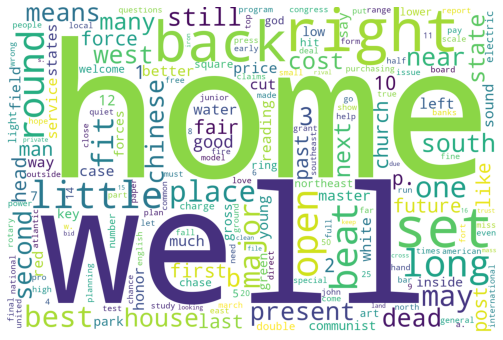

In [51]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

wordcloud = WordCloud(width=1500, height=1000, background_color='white').generate_from_frequencies(words_more_than_one_tag)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# Cross validation

In [52]:
import numpy as np
import seaborn as sns
from sklearn.model_selection import KFold

data = np.array(sentences_word_tag)
kf = KFold(n_splits=3)

print(kf)

KFold(n_splits=3, random_state=None, shuffle=False)


Define functions at calculate precision and recall

In [53]:
def precision_macro_avg(actual_tags, predicted_tags):

  mat2 = dict()
  for i in range(0, len(actual_tags)):
    t1 = predicted_tags[i]
    t2 = actual_tags[i]
    if t1 in mat2:
      if t2 in mat2[t1]:
        mat2[t1][t2] += 1
      else:
        mat2[t1][t2] = 1
    else:
      mat2[t1] = {t2:1}

  precision_labels = dict()

  for label in mat2.keys():
    if label in mat2[label]:
      precision_labels[label] = mat2[label][label]/sum(mat2[label].values())
    else:
      precision_labels[label] = 0

  print("Precision for each tag:", precision_labels)
  return sum(precision_labels.values())/len(mat2.keys()), precision_labels


In [54]:
def precision(actual_tags, predicted_tags, label):

  mat = dict()
  for i in range(0, len(actual_tags)):
    t1 = predicted_tags[i]
    t2 = actual_tags[i]
    if t1 in mat:
      if t2 in mat[t1]:
        mat[t1][t2] += 1
      else:
        mat[t1][t2] = 1
    else:
      mat[t1] = {t2:1}

  if label in mat and label in mat[label]:  
    p = mat[label][label] / sum(mat[label].values())
  else:
    p = 0

  return p

In [55]:
def recall_macro_avg(actual_tags, predicted_tags):

  mat3 = dict()
  for i in range(0, len(actual_tags)):
    t1 = actual_tags[i]
    t2 = predicted_tags[i]
    if t1 in mat3:
      if t2 in mat3[t1]:
        mat3[t1][t2] += 1
      else:
        mat3[t1][t2] = 1
    else:
      mat3[t1] = {t2:1}

  recall_labels = dict()

  for label in mat3.keys():
    if label in mat3[label]:
      recall_labels[label] = mat3[label][label]/sum(mat3[label].values())
    else:
      recall_labels[label] = 0

  print("Recall for each tag:", recall_labels)
  return sum(recall_labels.values())/len(mat3.keys()), recall_labels


In [56]:
def recall(actual_tags, predicted_tags, label):
  mat1 = dict()
  for i in range(0, len(actual_tags)):
    t1 = actual_tags[i]
    t2 = predicted_tags[i]
    if t1 in mat1:
      if t2 in mat1[t1]:
        mat1[t1][t2] += 1
      else:
        mat1[t1][t2] = 1
    else:
      mat1[t1] = {t2:1}

  if label in mat1 and label in mat1[label]:  
    r = mat1[label][label] / sum(mat1[label].values())
  else:
    r = 0

  return r

In [57]:
def confusion_matrix(actual_tags, predicted_tags):
  mat4 = dict()
  for i in range(0, len(actual_tags)):
    t1 = predicted_tags[i]
    t2 = actual_tags[i]
    if t1 in mat4:
      if t2 in mat4[t1]:
        mat4[t1][t2] += 1
      else:
        mat4[t1][t2] = 1
    else:
      mat4[t1] = {t2:1}

  conf_mat = np.zeros((len(set(actual_tags)), len(set(actual_tags))))
  labels_x = list(set(actual_tags)) #predicted labels
  labels_y = list(set(actual_tags)) #actual labels

  for key_pred in mat4.keys():
    p_ind = list(filter(lambda x: labels_x[x] == key_pred, range(len(labels_x))))
    for key_act in mat4[key_pred].keys():
      a_ind = list(filter(lambda x: labels_y[x] == key_act, range(len(labels_y))))
      try: 
        conf_mat[p_ind[0]][a_ind[0]] += mat4[key_pred][key_act]
      except:
        continue

  return conf_mat, labels_x

I perform a 3-fold cross-validation and compute the corresponding Emission and Transition probabilities on the training set. To predict the tag set for the validation set, I performed viterbi algorithm. 

**Bi-gram Model**

In [58]:
print("USING BI-GRAM MODEL")

for train_index, valid_index in kf.split(data):
  print("TRAIN:", train_index, "Validation:", valid_index)
  df_train, df_valid = data[train_index], data[valid_index]
  
  #intialize variables for this fold - emission probability
  tags_word_freq = dict()
  emission_prob = dict() # store the emission probability
  
  # create a dictionary that contains tags as key and a dictionary as values where the key would be the words and their values would be the frequency of words with that particular tag
  for sentence in df_train:
    for word_pair in sentence:
       word, tag = word_pair
       word = word.lower()
       if (tag in tags_word_freq):
         if (word in tags_word_freq[tag]):
           tags_word_freq[tag][word]+=1
         else:
           tags_word_freq[tag][word] = 1
       else:
         tags_word_freq[tag] = {word: 1}

  # compute emission probability
  for ts in tags_word_freq.keys():
    total = 0
    for t in tags_word_freq[ts].values():
      total += t
    emission_prob[ts] = {}
    for t in tags_word_freq[ts].keys():
      emission_prob[ts][t] = tags_word_freq[ts][t]/total

  # initialize probability for this fold - transition prob
  trans_dict = dict()
  transition_prob = dict() # store the transition probability

  # create a dictionary that holds frequency of tags required for the transition probability
  for s in df_train:
    word_pairs = list(nltk.bigrams(s))
    for word_pair in word_pairs:
      word1, tag1 = word_pair[0]
      word2, tag2 = word_pair[1]
      if tag1 in trans_dict:
        if tag2 in trans_dict[tag1]:
          trans_dict[tag1][tag2] += 1
        else:
          trans_dict[tag1][tag2] = 1
      else:
        trans_dict[tag1] = {tag2: 1}

  # compute transition probability
  for ts in trans_dict.keys():
    total = 0
    for t in trans_dict[ts].values():
      total += t
    transition_prob[ts] = {}
    for t in trans_dict[ts].keys():
      transition_prob[ts][t] = trans_dict[ts][t]/total

  #print(tags_word_freq)
  print("Emission Probabilities: ", emission_prob)
  print("Tranisition Probabilities: ", transition_prob)

  tags_of_words = dict() # dictionary stores the words as keys and tags are their values on the training dataset

  for sent in df_train:
    for word_pair in sent:
      word, tag = word_pair
      word = word.lower()
      if word in tags_of_words:
        if tag not in tags_of_words[word]:
          tags_of_words.setdefault(word, []).append(tag);
      else:
        lst = [tag]
        tags_of_words[word] = lst

  for sent in df_valid:
    for word_pair in sent:
      word, tag = word_pair
      word = word.lower()
      if word in tags_of_words:
        if tag not in tags_of_words[word]:
          tags_of_words.setdefault(word, []).append(tag);
      else:
        lst = [tag]
        tags_of_words[word] = lst

  predict_tags_sentences = []

  total_sequences = 0
  for sent in df_train:
    for word_pair in sent:
      word, tag = word_pair
      total_sequences += 1

  count = dict()

  for sent in df_train:
    for word_pair in sent:
      word, pair = word_pair
      word = word.lower()
      if word in count:
        count[word] +=1
      else:
        count[word] = 1

  for sent in df_valid:
    for word_pair in sent:
      word, pair = word_pair
      word = word.lower()
      if word in count:
        count[word] +=1
      else:
        count[word] = 1

  # Implement Viterbi Algorithm
  for sent in df_valid:

    predict_tags_sentence = []
    prev_values = {}

    for i in range(0, len(sent)):
      word, tag = sent[i]
      word = word.lower()
      prev_prob = 1

      if i==0: # if this is the first word
        prev_values[i] = {}
        all_words_tags = tags_of_words[word]
        for t in all_words_tags:
          if t in trans_dict.keys():
            t_p = sum(trans_dict[t].values())/total_sequences # transition probability
          else:
            t_p = 1/(count[word]+len(count))
          prev_values[i][t] = 1*t_p  #emission prob is 1; 

    #print("Previous values:", prev_values)
 
        ## pick the tag that has maximum prob
        max_key = max(prev_values[i], key=prev_values[i].get)
        prev_prob = prev_values[i][max_key] #store the prev prob
        predict_tags_sentence.append(tuple((word, max_key)))

      else:
        prev_values[i] = {}
        prev_state = max_key
        current_states  = tags_of_words[word]
        for t in current_states:
          if prev_state in transition_prob.keys() and t in transition_prob[prev_state].keys():
            t_p = transition_prob[prev_state][t]
          else:
            e_p = 0.000001
          if prev_state in emission_prob.keys() and word in emission_prob[prev_state].keys(): 
            e_p = emission_prob[prev_state][word]
          else:
            e_p = 0.000001
          prev_values[i][t] = t_p*e_p*prev_prob

        ## pick the tag that has maximum prob
        max_key = max(prev_values[i], key=prev_values[i].get)
        prev_prob = prev_values[i][max_key] #store the prev prob
        predict_tags_sentence.append(tuple((word, max_key)))

    #print(predict_tags_sentence)    
         
    predict_tags_sentences.append(predict_tags_sentence)

  ## compute the accuracy of model
  right = 0 
  wrong = 0

  for i in range(len(df_valid)):
    for h in range(len(df_valid[i])):
      if df_valid[i][h] == predict_tags_sentences[i][h]:
        right = right+1
      else:
        wrong = wrong +1 

  # fetch predicted and actual tags
  predicted_tags = []
  actual_tags = []

  for i in range(0, len(df_valid)):
    for j in range(0, len(df_valid[i])):
      word_a, tag_a = df_valid[i][j]
      actual_tags.append(tag_a)
      word_p, tag_p = predict_tags_sentences[i][j]
      predicted_tags.append(tag_p)

  print("Predicted 100 Tags:", predicted_tags[:100])
  print("Acutal 100 Tags:", actual_tags[:100])

  label = 'AT'  #input()
  p = precision(actual_tags, predicted_tags, label)
  print('Precision of tag {}:'.format(label), p)

  r = recall(actual_tags, predicted_tags, label)
  print('Recall of tag {}:'.format(label), r)

  p_avg, precision_labels = precision_macro_avg(actual_tags, predicted_tags)
  print('Total Precision: ', p_avg)

  r_avg, recall_labels = recall_macro_avg(actual_tags, predicted_tags)
  print('Total Recall: %.3f' % r_avg)
  
  f1_score_dict = dict()

  for key in precision_labels.keys():
    p = precision_labels[key]
    if key in recall_labels:
      r = recall_labels[key]
    else:
      r = 0
    if r!=0 and p!=0:
      f1_score_dict[key] = 2/((1/p)+(1/r))
    else:
      f1_score_dict[key] = 0
  
  print("F1-score for each tag: ", f1_score_dict)
  print("Total Accuracy:", right/(right+wrong))

  conf_mat, labels = confusion_matrix(actual_tags, predicted_tags)
  print("Confusion matrix: \n", conf_mat)
  print("\n")

  #sns.heatmap(conf_mat, annot=True)

  print("\n")





USING BI-GRAM MODEL
TRAIN: [17345 17346 17347 ... 52030 52031 52032] Validation: [    0     1     2 ... 17342 17343 17344]
Emission Probabilities:  {'CC': {'but': 0.11591152925641661, 'and': 0.7576957992902533, 'or': 0.10885532722621111, 'neither': 0.002434596022117686, 'nor': 0.005034249401667079, 'either': 0.005199306759098787, 'yet': 0.0029297680944128084, 'plus': 0.0005777007510109763, 'minus': 8.252867871585376e-05, 'butt': 8.252867871585376e-05, 'and/or': 0.00033011471486341505, 'though': 4.126433935792688e-05, "an'": 0.00033011471486341505, 'an': 0.0004951720722951226}, 'RB': {'inevitably': 0.0007322133181466867, 'back': 0.022983362486271, 'bitterly': 0.00048814221209779116, 'once': 0.011430663466623277, 'precisely': 0.0012203555302444779, 'thus': 0.008623845747060977, 'merely': 0.0033356384493349062, 'there': 0.017410405564821218, 'far': 0.006305170239596469, 'even': 0.02749867794817557, 'ever': 0.008949273888459505, 'never': 0.02009518773135907, 'thirdly': 4.067851767481593e-0

**Tri-gram Model**

In [59]:
print("USING TRI-GRAM MODEL")

for train_index, valid_index in kf.split(data):
  print("TRAIN:", train_index, "Validation:", valid_index)
  df_train, df_valid = data[train_index], data[valid_index]

  # initialize probability for this fold - transition prob
  trans_dict = dict()
  transition_prob = dict() # store the transition probability

  # create a dictionary that holds frequency of tags required for the transition probability
  for s in df_train:
    word_pairs = list(nltk.trigrams(s))
    for word_pair in word_pairs:
      word1, tag1 = word_pair[0]
      word2, tag2 = word_pair[1]
      word3, tag3 = word_pair[2]
      #print(tag1, tag2, tag3)
      if tag1 in trans_dict:
        if tag2 in trans_dict[tag1]:
          if tag3 in trans_dict[tag1][tag2]:
            trans_dict[tag1][tag2][tag3] += 1
          else:
            trans_dict[tag1][tag2][tag3] = 1
        else:
          trans_dict[tag1][tag2] = {tag3: 1}
      else:
        trans_dict[tag1] = {tag2: {tag3: 1}}

  #print("Transition dict:", trans_dict)

  # compute transition probability
  for t1 in trans_dict.keys():
    transition_prob[t1] = {}
    total = 0
    for t in trans_dict[t1].values():
      total += sum(t.values())
    for t2 in trans_dict[t1].keys():
      transition_prob[t1][t2] = {}
      for t3 in trans_dict[t1][t2].keys():
        transition_prob[t1][t2][t3] = trans_dict[t1][t2][t3]/total
   
  #print("Tranisition Probabilities: ", transition_prob)
  print("\n")

  tags_word_freq = dict()
  
  # create a dictionary that contains tags as key and a dictionary as values where the key would be the words and their values would be the frequency of words with that particular tag
  for sentence in df_train:
    for word_pair in sentence:
       word, tag = word_pair
       word = word.lower()
       if (tag in tags_word_freq):
         if (word in tags_word_freq[tag]):
           tags_word_freq[tag][word]+=1
         else:
           tags_word_freq[tag][word] = 1
       else:
         tags_word_freq[tag] = {word: 1}
  
  print("Emission dict:", tags_word_freq)

  # compute emission probability
  emission_prob = dict() # store the emission probability

  for ts in tags_word_freq.keys():
    total = 0
    for t in tags_word_freq[ts].values():
      total += t
    emission_prob[ts] = {}
    for t in tags_word_freq[ts].keys():
      emission_prob[ts][t] = tags_word_freq[ts][t]/total

  print("Emission Probabilitiy:", emission_prob)

  tags_of_words = dict() # dictionary stores the word as key and tags are their values on the training dataset

  for sent in df_train:
    for word_pair in sent:
      word, tag = word_pair
      word = word.lower()
      if word in tags_of_words:
        if tag not in tags_of_words[word]:
          tags_of_words.setdefault(word, []).append(tag);
      else:
        lst = [tag]
        tags_of_words[word] = lst

  for sent in df_valid:
    for word_pair in sent:
      word, tag = word_pair
      word = word.lower()
      if word in tags_of_words:
        if tag not in tags_of_words[word]:
          tags_of_words.setdefault(word, []).append(tag);
      else:
        lst = [tag]
        tags_of_words[word] = lst

  total_sequences = 0
  for sent in df_train:
    for word_pair in sent:
      word, tag = word_pair
      total_sequences += 1
  for sent in df_valid:
    for word_pair in sent:
      word, tag = word_pair
      total_sequences += 1

  predict_tags_sentences = [] # stores the predicted tags of all sentences

  # Implement Viterbi Algorithm

  for sent in df_valid:

    predict_tags_sentence = [] # stores the predicted tags of a sentence
    prev_values = {}

    for i in range(0, len(sent)):
      word, tag = sent[i]
      word = word.lower()
      prev_prob = 1

      if i==0 : # first word
        prev_values[i] = {}
        all_words_tags = tags_of_words[word]
        for t in all_words_tags:
          if t in trans_dict.keys():
            total = 0
            for ta in trans_dict[t].values():
              total += sum(ta.values())
            t_p = total/total_sequences # transition probability
          else:
            t_p = 1/(count[word]+len(count))
          prev_values[i][t] = 1*t_p  #emission prob is 1; 
      
 
        ## pick the tag that has maximum prob
        prev_state_1 = max(prev_values[i], key=prev_values[i].get) # first predicted tag of a sentence
        prev_prob = prev_values[i][prev_state_1] # store the prev prob
        predict_tags_sentence.append(tuple((word, prev_state_1)))

      elif i==1: # second word
        prev_values[i] = {}
        all_words_tags = tags_of_words[word]
        for t1 in all_words_tags:
          if t1 in trans_dict.keys() and prev_state_1 in trans_dict[t1].keys():
            total = sum(trans_dict[t1][prev_state_1].values())
            t_p = total/total_sequences # transition probability
          else:
            t_p = 1/(count[word]+len(count))
          prev_values[i][t1] = 1*t_p  #emission prob is 1; 
      
        #print(prev_values)
 
        ## pick the tag that has maximum prob
        prev_state_2 = max(prev_values[i], key=prev_values[i].get)
        prev_prob = prev_values[i][prev_state_2] #store the prev prob
        predict_tags_sentence.append(tuple((word, prev_state_2)))


      else:
        prev_values[i] = {}
        current_states  = tags_of_words[word]
        for t in current_states:
          if prev_state_2 in transition_prob.keys() and prev_state_1 in transition_prob[prev_state_2].keys() and t in transition_prob[prev_state_2][prev_state_1].keys():
            t_p = transition_prob[prev_state_2][prev_state_1][t]
          else:
            a = 0.000001
          if prev_state_1 in emission_prob.keys() and word in emission_prob[prev_state_1].keys(): 
            e_p = emission_prob[prev_state_1][word]
          else:
            a = 0.000001
          prev_values[i][t] = t_p*e_p*prev_prob

        ## pick the tag that has maximum prob
        prev = max(prev_values[i], key=prev_values[i].get)
        prev_prob = prev_values[i][prev] #store the prev prob
        predict_tags_sentence.append(tuple((word, prev)))
        prev_state_1 = prev_state_2
        prev_state_2 = prev

    predict_tags_sentences.append(predict_tags_sentence)

  ## compute the accuracy of model
  right = 0 
  wrong = 0

  for i in range(len(df_valid)):
    for h in range(len(df_valid[i])):
      if df_valid[i][h] == predict_tags_sentences[i][h]:
        right = right+1
      else:
        wrong = wrong +1 

  # fetch predicted and actual tags
  predicted_tags = []
  actual_tags = []

  for i in range(0, len(df_valid)):
    for j in range(0, len(df_valid[i])):
      word_a, tag_a = df_valid[i][j]
      actual_tags.append(tag_a)
      word_p, tag_p = predict_tags_sentences[i][j]
      predicted_tags.append(tag_p)

  print("Predicted 100 Tags:", predicted_tags[:100])
  print("Acutal 100 Tags:", actual_tags[:100])

  label = 'AT'  #input()
  p = precision(actual_tags, predicted_tags, label)
  print('Precision of tag {}:'.format(label), p)

  r = recall(actual_tags, predicted_tags, label)
  print('Recall of tag {}:'.format(label), r)

  p_avg, precision_labels = precision_macro_avg(actual_tags, predicted_tags)
  print('Total Precision: ', p_avg)

  r_avg, recall_labels = recall_macro_avg(actual_tags, predicted_tags)
  print('Total Recall: %.3f' % r_avg)
  
  f1_score_dict = dict()

  for key in precision_labels.keys():
    p = precision_labels[key]
    if key in recall_labels:
      r = recall_labels[key]
    else:
      r = 0
    if r!=0 and p!=0:
      f1_score_dict[key] = 2/((1/p)+(1/r))
    else:
      f1_score_dict[key] = 0
  
  print("F1-score for each tag: ", f1_score_dict)
  print("Total Accuracy:", right/(right+wrong))

  conf_mat, labels = confusion_matrix(actual_tags, predicted_tags)
  print("Confusion matrix: \n", conf_mat)
  print("\n")
  #sns.heatmap(conf_mat, annot=True)

  print("\n")


USING TRI-GRAM MODEL
TRAIN: [17345 17346 17347 ... 52030 52031 52032] Validation: [    0     1     2 ... 17342 17343 17344]


Emission dict: {'CC': {'but': 2809, 'and': 18362, 'or': 2638, 'neither': 59, 'nor': 122, 'either': 126, 'yet': 71, 'plus': 14, 'minus': 2, 'butt': 2, 'and/or': 8, 'though': 1, "an'": 8, 'an': 12}, 'RB': {'inevitably': 18, 'back': 565, 'bitterly': 12, 'once': 281, 'precisely': 30, 'thus': 212, 'merely': 82, 'there': 428, 'far': 155, 'even': 676, 'ever': 220, 'never': 494, 'thirdly': 1, 'but': 21, 'historically': 13, 'personally': 24, 'thereafter': 13, 'except': 7, 'perhaps': 206, 'really': 150, 'else': 132, 'therefore': 156, 'hideously': 3, 'simply': 116, 'comparatively': 3, 'before': 120, 'surely': 30, 'however': 288, 'too': 187, 'yet': 202, 'long': 98, 'naturally': 37, 'forward': 69, 'then': 920, 'immediately': 72, 'only': 917, 'here': 511, 'now': 897, 'somehow': 58, 'often': 205, 'about': 321, 'still': 472, 'straight': 38, 'away': 332, 'moreover': 66, 'artisti

After plotting the confusion matrix, it is clear that the tags are incorrectly indentified by HMM are 'CS', 'NN-TL', 'NNS-TL', 'DO', 'RBR', 'NN-TL' and many more. And the tags are most easy to identify are 'AT', 'NN', 'WDT, 'HVZ', 'NNS' and many more. 

### Statistics of tag set





*   Total number of unique tags in the vocab: 422
*   Total number of words corresponding to some tag-sets are: {'AT': 97959, 'NP-TL': 4018, 'NN-TL': 13372, 'JJ-TL': 4107, 'VBD': 26167, 'NR': 1643, 'NN': 154033, 'IN': 120447, 'NP': 37180, 'JJ': 64028}
*   Example of some words with their corresponding tag values: {'fulton': ['NP-TL', 'NP'], 'county': ['NN-TL', 'NN', 'NN-HL'], 'grand': ['JJ-TL', 'JJ', 'FW-JJ-TL'], 'jury': ['NN-TL', 'NN', 'NN-HL'], 'said': ['VBD', 'VBN', 'VBN-HL'], 'friday': ['NR', 'NR-TL', 'NP'], 'investigation': ['NN', 'NN-TL']}
*   Plot of all those words with more than one tags:

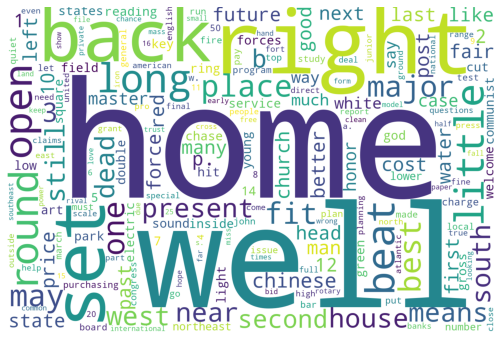




## Work out the mathematics of HMM for Markov assumption length 2, and include it in your assignment report.

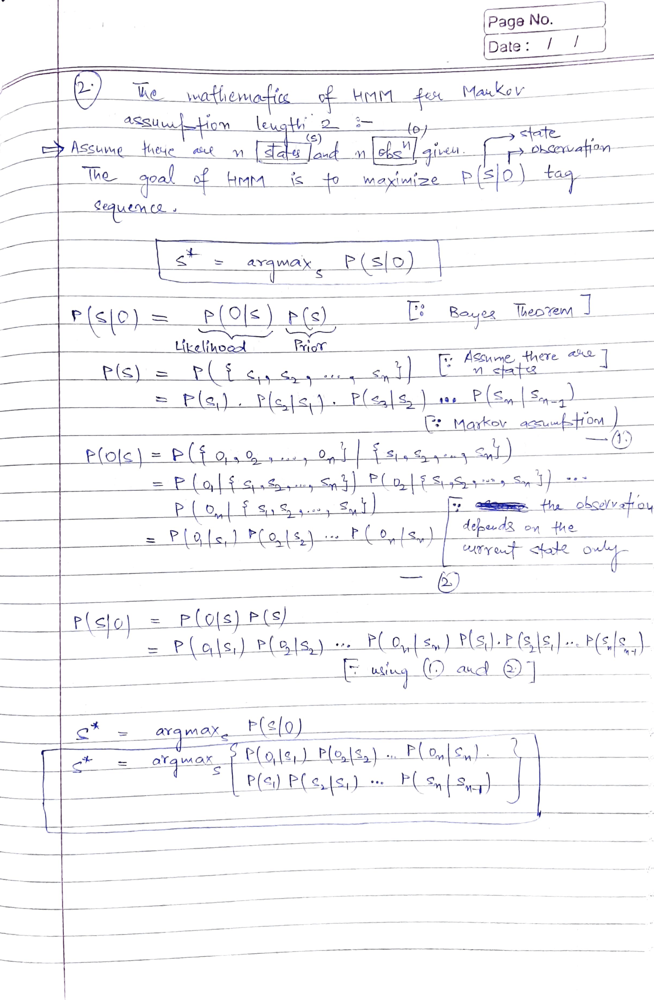

# Which word types are most frequently tagged incorrectly by the HMM, and why?

The word-type with tags like 'NN-TL', 'RP', 'TO', 'AT' are most frequently tagged incorrectly. One reason could be the number of words with such tags are less in the training data which results in lower likelihood probability. 

In [61]:
# make pdf of the google colab
%%capture
!wget -nc https://raw.githubusercontent.com/brpy/colab-pdf/master/colab_pdf.py
from colab_pdf import colab_pdf
colab_pdf('code_nlp_ass2.ipynb')